In [2]:
from netCDF4 import Dataset
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from numpy import hstack,vstack,dstack
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans
import math
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from uilts import *
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM,CuDNNLSTM,Embedding,Activation,BatchNormalization,LeakyReLU,PReLU
import pandas as pd
from keras.callbacks import EarlyStopping
from keras.layers import Dense
from keras.layers import Dropout
from keras.activations import softsign
import matplotlib.pyplot as plt  
from datetime import datetime   
import numpy as np
import statsmodels.api as sm     
from statsmodels.tsa.stattools import adfuller  
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.arima_model import ARIMA  
from statsmodels.tsa.arima_model import ARIMAResults
from tqdm import tqdm
from keras.initializers import Constant
from keras.optimizers import  Adam
import pickle
from keras.models import load_model
 

2022-10-31 02:17:59.365277: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-31 02:17:59.483596: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-31 02:17:59.939589: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2022-10-31 02:17:59.939674: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or 

# create or check the folder

In [3]:
import os 
plot_folder = '../plots'
numpy_folder = '../numpy'
LSTM_models_folder = '../LSTM_models'
ARIMA_models_folder = '../ARIMA_models'
LSTM_summary_folder = '../LSTM_summary'
ARIMA_summary_folder = '../ARIMA_summary'
mkdir(plot_folder)
mkdir(numpy_folder)
mkdir(LSTM_models_folder)
mkdir(ARIMA_models_folder)
mkdir(LSTM_summary_folder)
mkdir(ARIMA_summary_folder)

---  There is this folder!  ---
---  There is this folder!  ---
---  There is this folder!  ---
---  There is this folder!  ---
---  There is this folder!  ---
---  There is this folder!  ---


# Load the data

In [3]:
airTemp = '../global-longrun_jedi-dvgm_inputs_outputs/tas.nc'
netLongRadiantionFlux = '../global-longrun_jedi-dvgm_inputs_outputs/rlns.nc'
shortwaveRadiation = '../global-longrun_jedi-dvgm_inputs_outputs/rsds.nc'
precipitation = '../global-longrun_jedi-dvgm_inputs_outputs/pr.nc'
output = '../global-longrun_jedi-dvgm_inputs_outputs/jedi_output.nc'

landSeaMask = '../global-longrun_jedi-dvgm_inputs_outputs/landsea.nc'
lantitude =  '../global-longrun_jedi-dvgm_inputs_outputs/latitude.nc'
longitude = '../global-longrun_jedi-dvgm_inputs_outputs/longitude.nc'
elevation = '../global-longrun_jedi-dvgm_inputs_outputs/elevation.nc'
moisture = '../global-longrun_jedi-dvgm_inputs_outputs/paw.nc'
spatialMetaData = '../global-longrun_jedi-dvgm_inputs_outputs/globe_surf.nc'

airTempDataset = Dataset(airTemp)
netLongRadiantionFluxDataSet = Dataset(netLongRadiantionFlux)
shortwaveRadiationDataset = Dataset(shortwaveRadiation)
precipitationDataSet = Dataset(precipitation)
outputDataset = Dataset(output)

landSeaMaskDataset = Dataset(landSeaMask)
lantitudeDataset = Dataset(lantitude)
longitudeDataset = Dataset(longitude)
elevationDataset = Dataset(elevation)
moistureDataset = Dataset(moisture)
spatialMetaDataset = Dataset(spatialMetaData)

airTempArray = airTempDataset['tas'][:].squeeze()
netLongRadiantionFluxArray = netLongRadiantionFluxDataSet['rlns'][:].squeeze()
shortwaveRadiationArray = shortwaveRadiationDataset['rsds'][:].squeeze()
precipitationArray = precipitationDataSet['pr'][:].squeeze()
NPPArray = outputDataset['NPP'][:].squeeze()
landSeaMaskArray = landSeaMaskDataset['var1'][:].squeeze()
lantitudeArray = lantitudeDataset['lat'][:].squeeze()
longitudeArray = longitudeDataset['lon'][:].squeeze()
elevationArray = elevationDataset['data'][:].squeeze()
moistureArray = moistureDataset['paw'][:].squeeze()
spatialMetaDataArray = spatialMetaDataset['lev']



# Data preprocessing 

In [4]:
reshape_NPP = NPPArray.reshape(3516,-1)
col_index_0 = []
for i in range(reshape_NPP.shape[1]):
    if np.all(reshape_NPP[:,i] == 0) == True:
        col_index_0.append(i)
        continue
    if np.count_nonzero(reshape_NPP[:,i])<3400:
        col_index_0.append(i) 
np.save('../numpy/land_sea_label',np.array(col_index_0))

In [5]:
reshape_airTemp = airTempArray.reshape(3516,-1)
reshape_precipitation = precipitationArray.reshape(3516,-1)
reshape_netLongRadiantionFlux = netLongRadiantionFluxArray.reshape(3516,-1)
reshape_shortwaveRadiation = shortwaveRadiationArray.reshape(3516,-1)
clear_npp = np.delete(reshape_NPP,col_index_0,axis=1)
clear_airTemp = np.delete(reshape_airTemp,col_index_0,axis=1)
clear_precip = np.delete(reshape_precipitation,col_index_0,axis=1)
clear_rlns = np.delete(reshape_netLongRadiantionFlux,col_index_0,axis=1)
clear_rsds = np.delete(reshape_shortwaveRadiation,col_index_0,axis=1)

In [6]:
mean_airTemp = clear_airTemp.reshape((-1, 12,clear_npp.shape[1])).mean( axis=1)[20:-20,:]
mean_Precip = clear_precip.reshape((-1, 12,clear_npp.shape[1])).mean( axis=1)[20:-20,:]
mean_rlns = clear_rlns.reshape((-1, 12, clear_npp.shape[1])).mean( axis=1)[20:-20,:]
mean_rsds = clear_rsds.reshape((-1, 12, clear_npp.shape[1])).mean( axis=1)[20:-20,:]
mean_npp = clear_npp.reshape((-1, 12, clear_npp.shape[1])).mean( axis=1)[20:-20,:]

In [7]:
NPPAnnualArray = getAnnualAndFlatten(clear_npp, 12)[:,20:-20]

# Clustering

In [ ]:
cluster_count = math.ceil(math.sqrt(len(NPPAnnualArray))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN

#use the metrix "dynamica time warping " to measure the similarities between temporal sequences
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw",n_jobs= -1)

labels = km.fit_predict(NPPAnnualArray)

In [8]:
np.save('../numpy/1labels',np.array(labels))

NameError: name 'labels' is not defined

In [8]:
labels = np.load("../numpy/1labels.npy")

In [9]:
cluster_count = math.ceil(math.sqrt(len(NPPAnnualArray))) 

## plot cluster

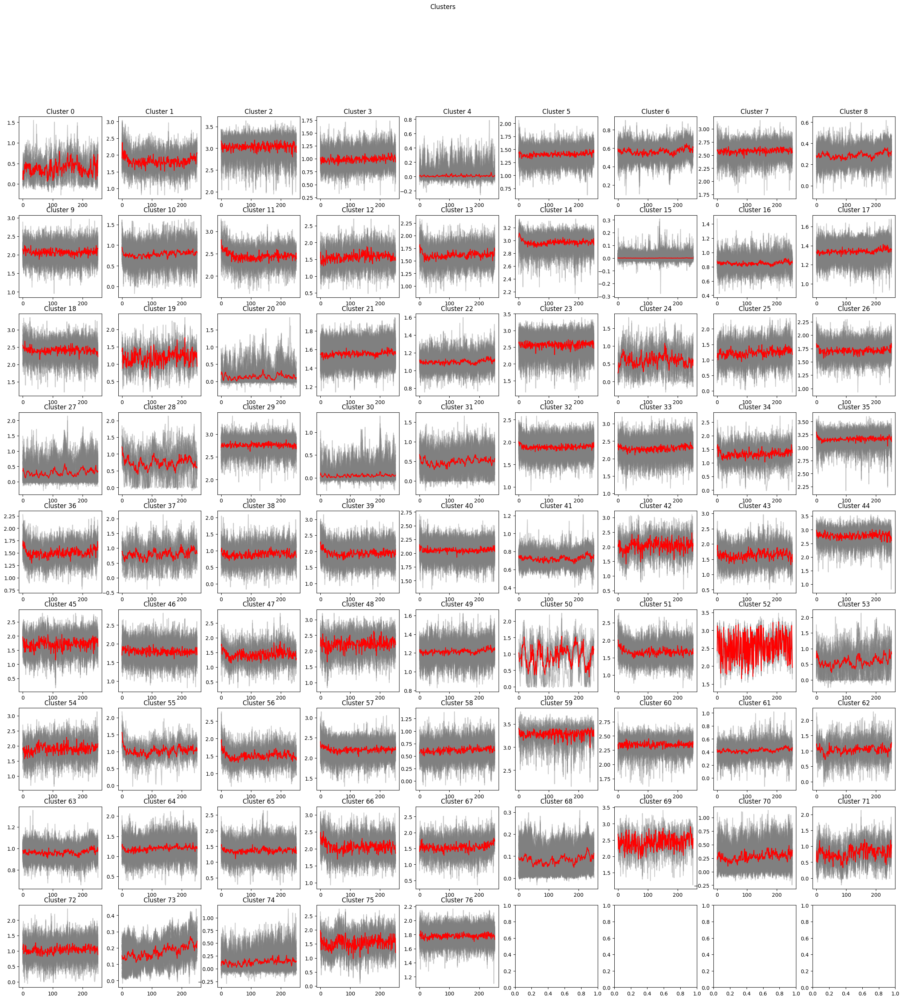

In [11]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(plot_count,plot_count,figsize=(30,30))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []

    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(NPPAnnualArray[i],c="gray",alpha=0.4)
                cluster.append(NPPAnnualArray[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i * plot_count +column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
plt.savefig("../plots/cluster.jpg")       
plt.show()

In [10]:
cluster = {}
for label in set(labels):
    modelname = str(label)+'model'
    data = hstack((mean_airTemp[:,np.argwhere(labels ==label).reshape(-1)].filled().mean(axis = 1).reshape(-1,1),
                    mean_Precip[:,np.argwhere(labels ==label).reshape(-1)].filled().mean(axis = 1).reshape(-1,1),
                    mean_rlns[:,np.argwhere(labels ==label).reshape(-1)].filled().mean(axis = 1).reshape(-1,1),
                    mean_rsds[:,np.argwhere(labels ==label).reshape(-1)].filled().mean(axis = 1).reshape(-1,1),
                    mean_npp[:,np.argwhere(labels ==label).reshape(-1)].filled().mean(axis = 1).reshape(-1,1)))
    train, test = split_timeseries(data,4/5)
    cluster[modelname] = {'train':train,'test':test}
np.save('../numpy/cluster_data.npy', cluster)

In [11]:
cluster = np.load('../numpy/cluster_data.npy',allow_pickle = True).item()

In [12]:
# data presentation
pd.DataFrame(data).rename(columns={0:'airTemp',1:'precipitation',2:'net long radiation flux',3:'shortwave radiation',4:'NPP'})

,airTemp,precipitation,net long radiation flux,shortwave radiation,NPP
0,285.577819,0.000043,-49.226501,151.178897,1.792433
1,285.446070,0.000042,-49.526455,151.996865,1.787835
2,285.581772,0.000040,-51.728294,154.675143,1.806937
3,285.552491,0.000042,-49.869608,152.997939,1.772468
4,285.579720,0.000044,-49.899226,151.920959,1.852185
...,...,...,...,...,...
248,285.265079,0.000044,-51.590119,152.435466,1.787451
249,285.147888,0.000039,-50.898729,153.363256,1.770818
250,285.576509,0.000043,-51.049632,151.496099,1.781507
251,285.110507,0.000042,-49.464905,150.686150,1.786615


# 128 LSTM

100%|██████████| 77/77 [09:09<00:00,  7.14s/it]


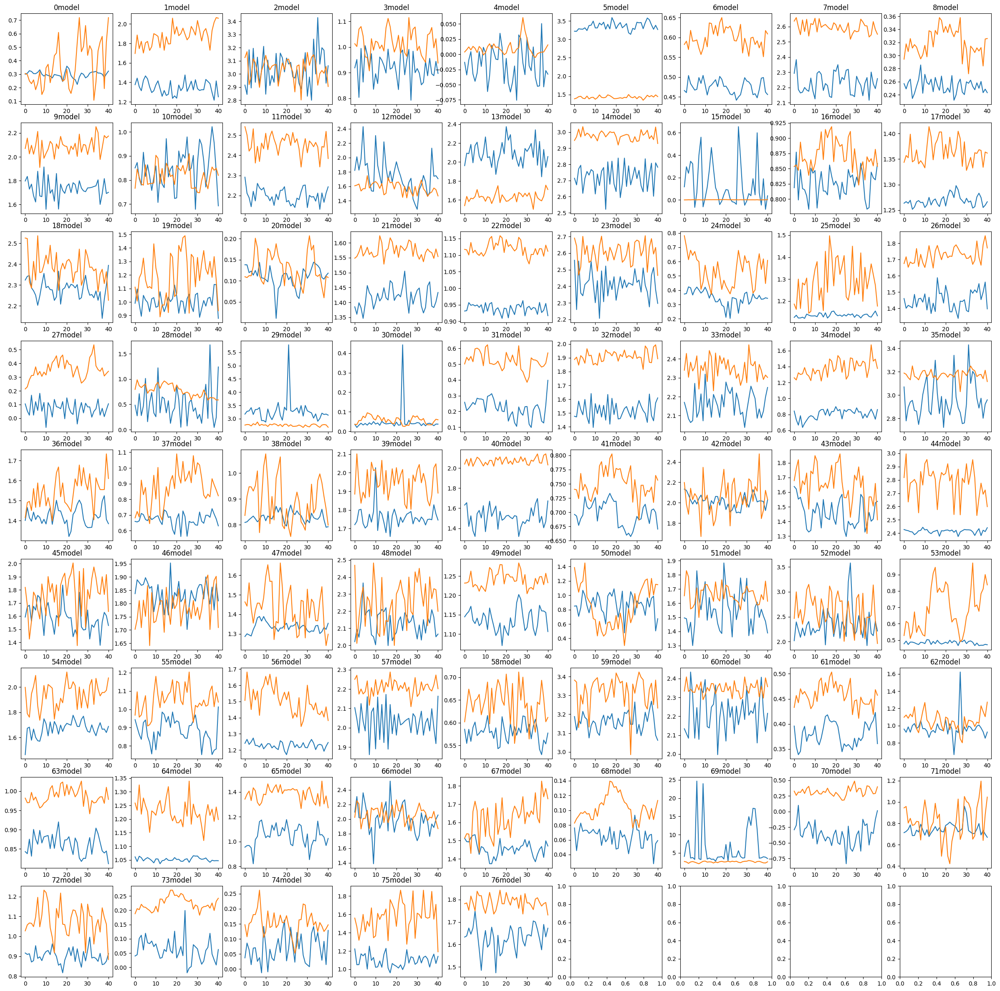

In [133]:

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(30,30))
n_step = 10
model_dict = {}
maescore = []
for key,value in enumerate(tqdm(cluster)):
    train_x, train_y = split_sequences(cluster[value]['train'], n_step)
    test_x, test_y = split_sequences(cluster[value]['test'], n_step)
    model = Sequential()
    model.add(LSTM(128,input_shape=(train_x.shape[1:]),activation='PReLU',recurrent_activation='hard_sigmoid'))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(optimizer=Adam(), loss='mean_squared_error')
    earlyStop = EarlyStopping(monitor='loss', mode = 'min',min_delta = 0.003,patience=5, verbose=0, restore_best_weights = True)
    model.fit(train_x, train_y, epochs=500,callbacks=[earlyStop], validation_data=(test_x, test_y),verbose=0)
    path = '../LSTM_models/'+value+'_128_LSTM.h5'
    model.save(path)
    y_hat = model.predict(test_x,verbose=0)
    scores = model.evaluate(test_x, test_y,verbose=0)
    maescore.append(scores)
    axs[ key//plot_count,key%plot_count].plot(y_hat,label = "NPP_hat")
    axs[key//plot_count,key%plot_count].plot(test_y,label = "original NPP",)
    axs[key//plot_count,key%plot_count].set_title(value)
plt.title("LSTM forcast over 77 clusters",fontsize=15)
np.save('../numpy/128mse',np.array(maescore))
plt.savefig("../plots/lstm128.jpg")       
plt.show()


# 64 LSTM

100%|██████████| 77/77 [07:24<00:00,  5.78s/it]


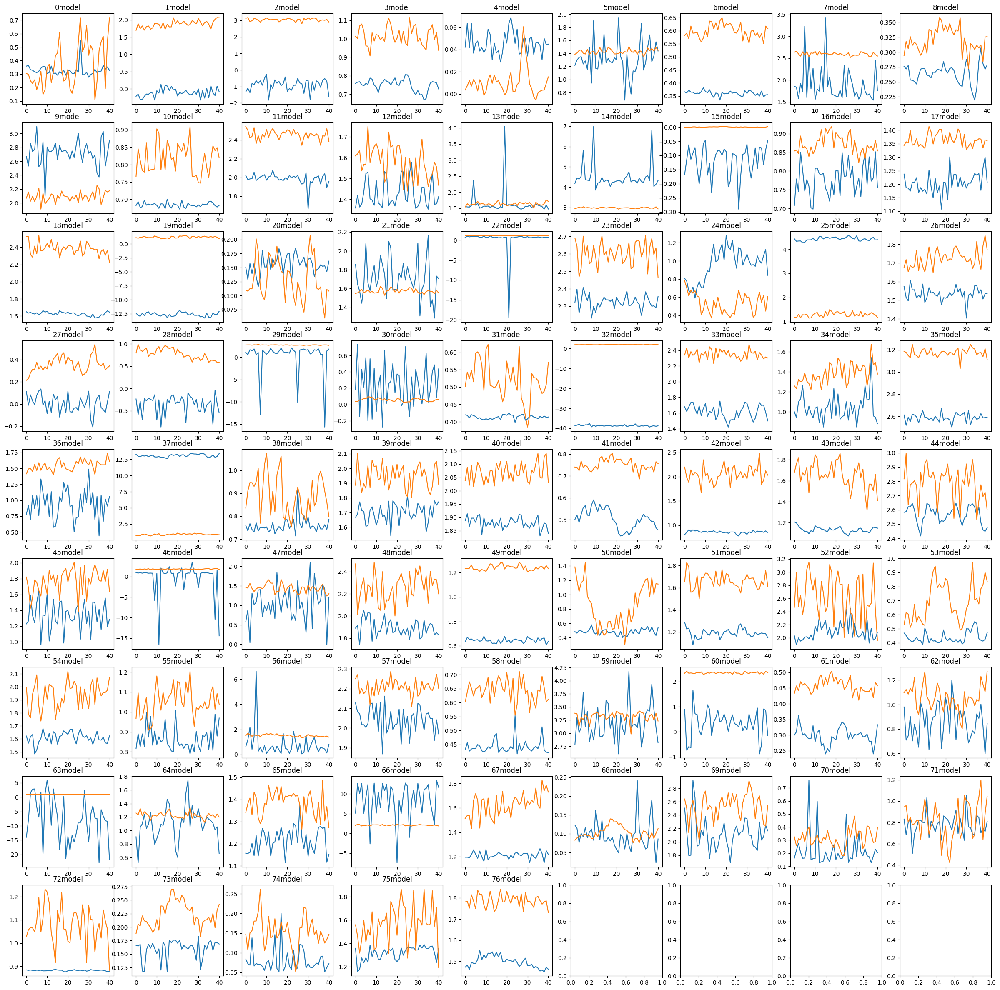

In [134]:
plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(30,30))
n_step = 10
model_dict = {}
maescore = []
for key,value in enumerate(tqdm(cluster)):
    train_x, train_y = split_sequences(cluster[value]['train'], n_step)
    test_x, test_y = split_sequences(cluster[value]['test'], n_step)
    model = Sequential()
    model.add(LSTM(64,input_shape=(train_x.shape[1:]),activation='PReLU',recurrent_activation='hard_sigmoid'))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(optimizer=Adam(), loss='mean_squared_error')
    earlyStop = EarlyStopping(monitor='loss', mode = 'min',min_delta = 0.003,patience=5, verbose=0, restore_best_weights = True)
    model.fit(train_x, train_y, epochs=500,callbacks=[earlyStop], validation_data=(test_x, test_y),verbose=0)
    path = '../LSTM_models/'+value+'_64_LSTM.h5'
    model.save(path)
    y_hat = model.predict(test_x,verbose=0)
    scores = model.evaluate(test_x, test_y,verbose=0)
    maescore.append(scores)
    axs[ key//plot_count,key%plot_count].plot(y_hat,label = "NPP_hat")
    axs[key//plot_count,key%plot_count].plot(test_y,label = "original NPP",)
    axs[key//plot_count,key%plot_count].set_title(value)
np.save('../numpy/64mse',np.array(maescore))
plt.savefig("../plots/lstm64.jpg")       
plt.show()


# 32 LSTM

  0%|          | 0/77 [00:00<?, ?it/s]/home/nathan/anaconda3/envs/DL/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
100%|██████████| 77/77 [10:01<00:00,  7.81s/it]


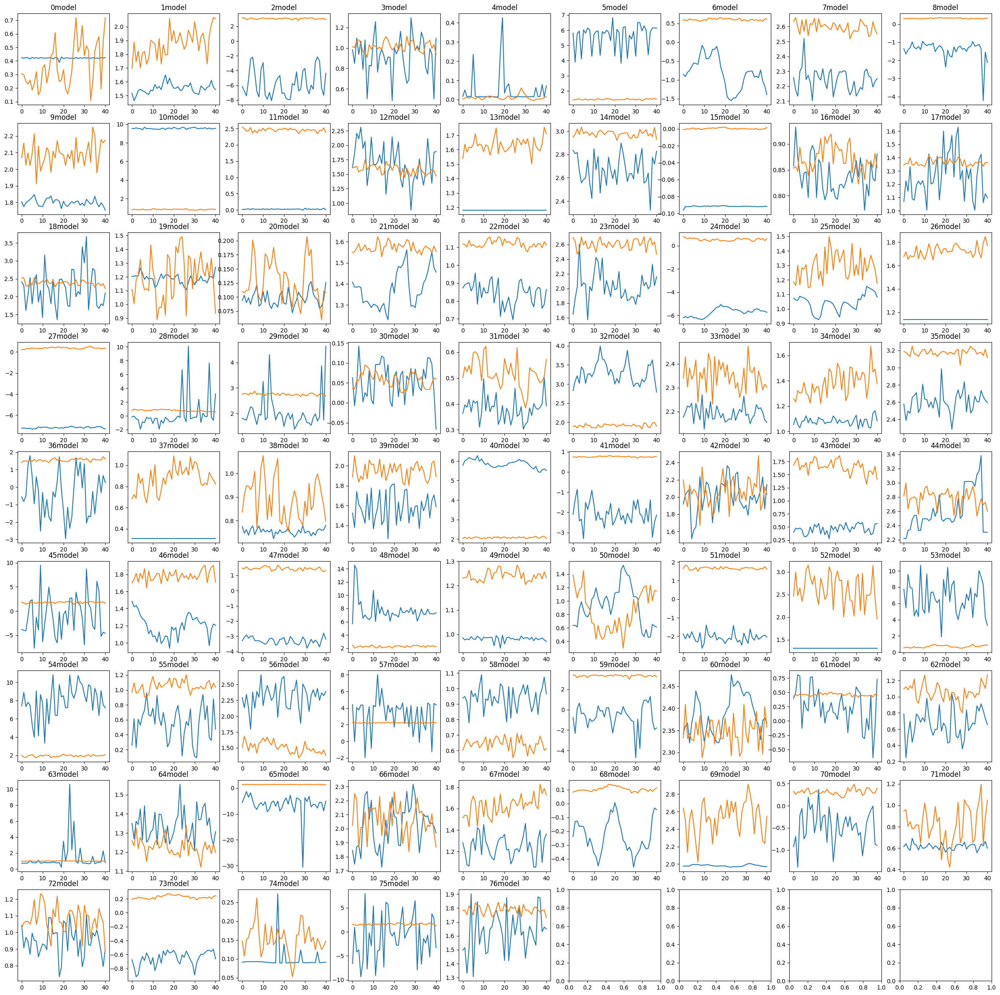

In [125]:
plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(30,30))
n_step = 10
model_dict = {}
maescore = []
for key,value in enumerate(tqdm(cluster)):
    train_x, train_y = split_sequences(cluster[value]['train'], n_step)
    test_x, test_y = split_sequences(cluster[value]['test'], n_step)
    model = Sequential()
    model.add(LSTM(32,input_shape=(train_x.shape[1:]),activation='PReLU',recurrent_activation='hard_sigmoid'))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(optimizer=Adam(), loss='mean_squared_error')
    earlyStop = EarlyStopping(monitor='loss', mode = 'min',min_delta = 0.003,patience=5, verbose=0, restore_best_weights = True)
    model.fit(train_x, train_y, epochs=500,callbacks=[earlyStop], validation_data=(test_x, test_y),verbose=0)
    path = '../LSTM_models/'+value+'_32_LSTM.h5'
    model.save(path)
    y_hat = model.predict(test_x,verbose=0)
    scores = model.evaluate(test_x, test_y,verbose=0)
    maescore.append(scores)
    axs[ key//plot_count,key%plot_count].plot(y_hat,label = "NPP_hat")
    axs[key//plot_count,key%plot_count].plot(test_y,label = "original NPP",)
    axs[key//plot_count,key%plot_count].set_title(value)
np.save('../numpy/32mse',np.array(maescore))
plt.savefig("../plots/lstm32.jpg")       
plt.show()


In [13]:
lstm128 = np.load('../numpy/128mae.npy',allow_pickle = True)
lstm64 = np.load('../numpy/64mae.npy',allow_pickle = True)
lstm32 = np.load('../numpy/32mae.npy',allow_pickle = True)

# Plot of Mean_Square_Error_with_128_neurons

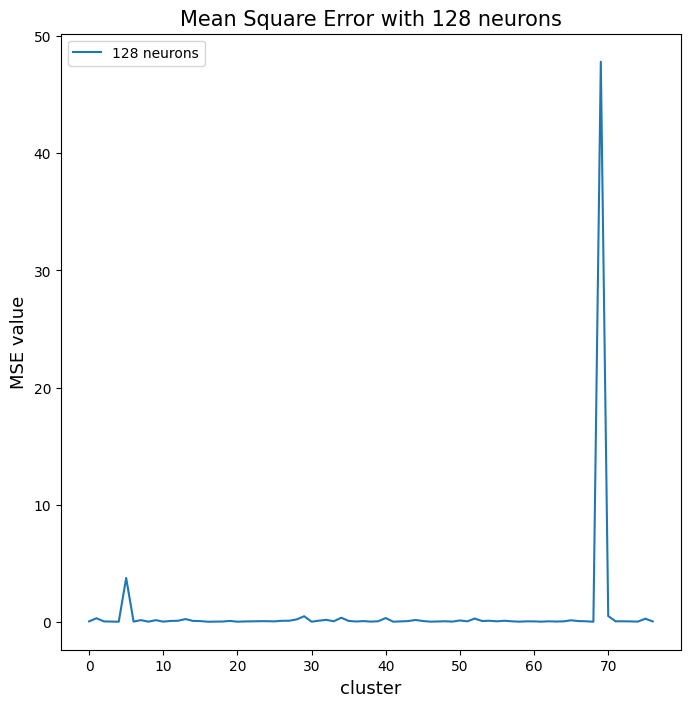

In [14]:
plt.figure(figsize=(8,8))
plt.plot(lstm128,label = '128 neurons')
plt.title("Mean Square Error with 128 neurons",fontsize=15)
plt.xlabel("cluster",fontsize=13)
plt.ylabel("MSE value",fontsize=13)
plt.legend()
plt.savefig("../plots/Mean_Square_Error_with_128_neurons.jpg")       


# Plot of Mean_Square_Error_with_128,64,32_neurons

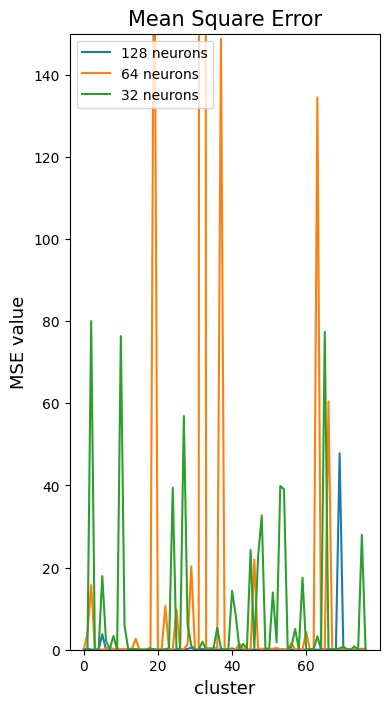

In [15]:

plt.figure(figsize=(4,8))
plt.plot(lstm128,label = '128 neurons')
plt.plot(lstm64,label = '64 neurons')
plt.plot(lstm32,label = '32 neurons')
plt.title("Mean Square Error",fontsize=15)
plt.xlabel("cluster",fontsize=13)
plt.ylabel("MSE value",fontsize=13)
plt.ylim(0,150)
plt.legend()
plt.savefig("../plots/Mean_Square_Error.jpg")       

# ARIMA model

100%|██████████| 77/77 [14:37<00:00, 11.39s/it]


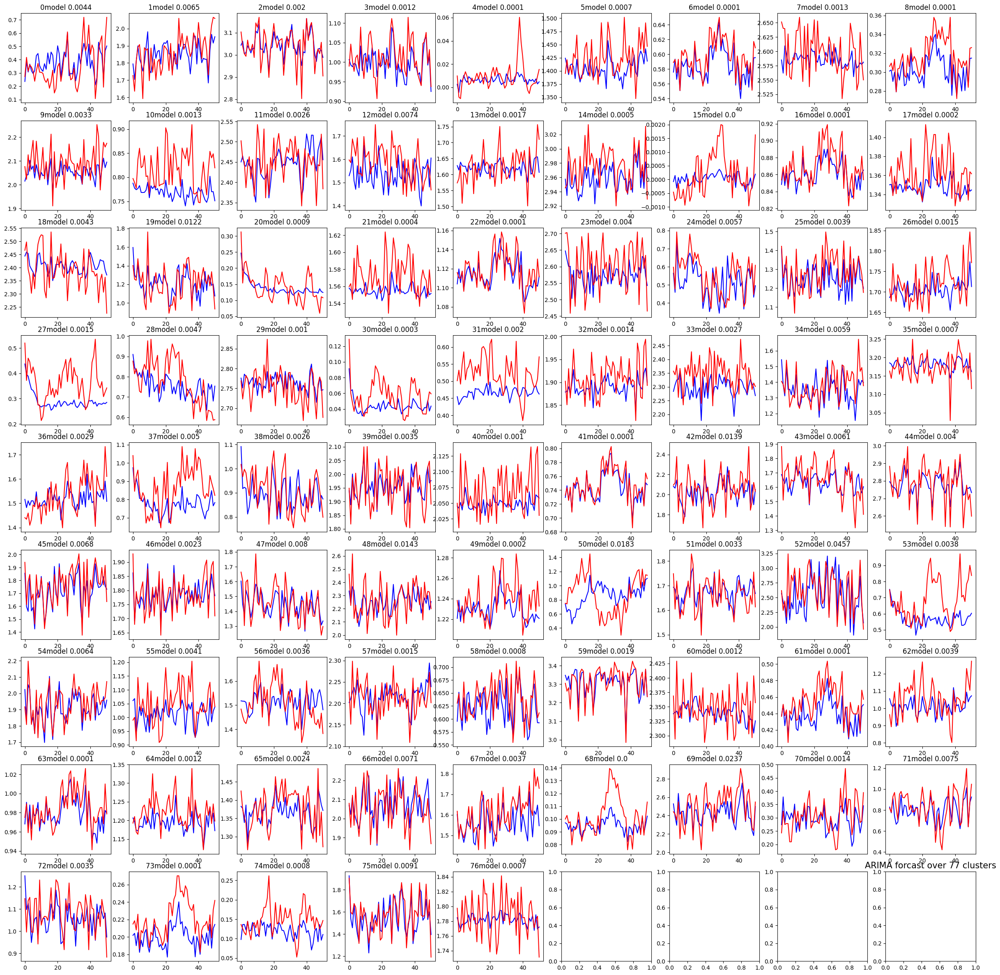

In [18]:

import warnings
warnings.filterwarnings("ignore")
plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(30,30))
n_step = 4
model_dict = {}
arima_mse = []
for key,value in enumerate(tqdm(cluster)):
    train= cluster[value]['train'][:,-1]
    exog_train = cluster[value]['train'][:,:-1]
    test = cluster[value]['test'][:,-1]
    exog_test = cluster[value]['test'][:,:-1]
    p,d,q = arima_para(train)
    model=sm.tsa.arima.ARIMA(train,order =(p,d,q),exog=exog_train).fit(method='innovations_mle')
    model_name = '../ARIMA_models/'+value+'_arima.pkl'
    model.save(model_name)
    pred = model.forecast(test.shape[0],exog = exog_test)
    axs[ key//plot_count,key%plot_count].plot(pred,label = "NPP_hat",color='blue')
    axs[key//plot_count,key%plot_count].plot(test,label = "original NPP",color='red')
    axs[key//plot_count,key%plot_count].set_title(value+' '+str(round(model.mse,4)))
    arima_mse.append(model.mse)
np.save('../numpy/arimamse',np.array(arima_mse))
plt.title("ARIMA forcast over 77 clusters",fontsize=15)
plt.savefig("../plots/ARIMA.jpg") 
plt.show()

In [16]:
loaded_model  = pickle.load(open( '../ARIMA_models/0model_arima.pkl', 'rb'))

# Mean_Square_Error_with_ARIMA

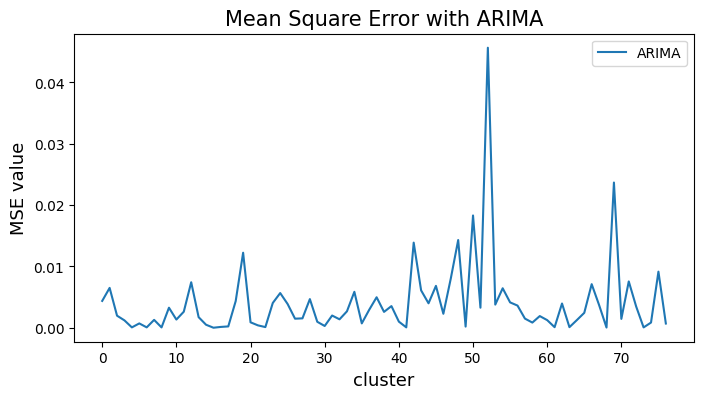

In [17]:
arima = np.load('arimamse.npy',allow_pickle = True)
plt.figure(figsize=(8,4))
plt.plot(arima,label = 'ARIMA')
plt.title("Mean Square Error with ARIMA",fontsize=15)
plt.xlabel("cluster",fontsize=13)
plt.ylabel("MSE value",fontsize=13)
plt.legend()
plt.savefig("../plots/Mean_Square_Error_with_ARIMA.jpg") 

In [18]:
params=loaded_model.params
tvalues=loaded_model.tvalues
pvalues=loaded_model.pvalues
result_mat=pd.DataFrame({'Estimate':params,'t-values':tvalues,'pvalues':pvalues})
print(result_mat) 
    
print('AIC is '+str(loaded_model.aic))
print('MSE：%f' %loaded_model.mse)


        Estimate      t-values       pvalues
0     -12.272395 -2.729883e+00  6.335677e-03
1       0.044252  2.892123e+00  3.826486e-03
2   20042.219886  2.058531e+06  0.000000e+00
3       0.001998  2.246157e-01  8.222783e-01
4      -0.002659 -8.322586e-01  4.052630e-01
5      -0.031016 -1.349070e-01  8.926854e-01
6       0.526989  3.535288e+00  4.073317e-04
7       0.133466  1.471154e+00  1.412494e-01
8      -0.003678 -3.779612e-02  9.698502e-01
9       0.054801  6.220526e-01  5.339073e-01
10      0.060249  7.225176e-01  4.699763e-01
11     -0.176581 -2.117180e+00  3.424454e-02
12      0.646952  2.769152e+00  5.620242e-03
13      0.004315  8.670650e+00  4.296604e-18
AIC is -497.72522553466627
MSE：0.004372


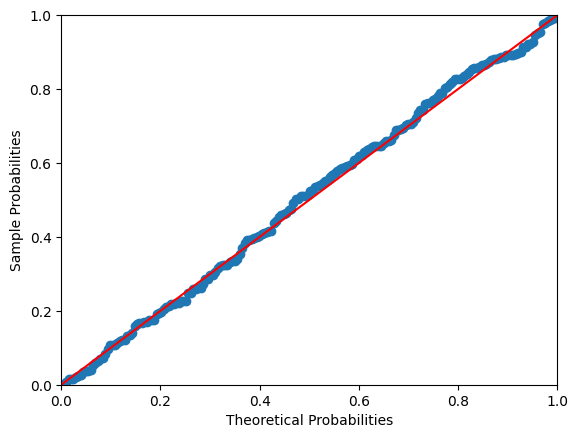

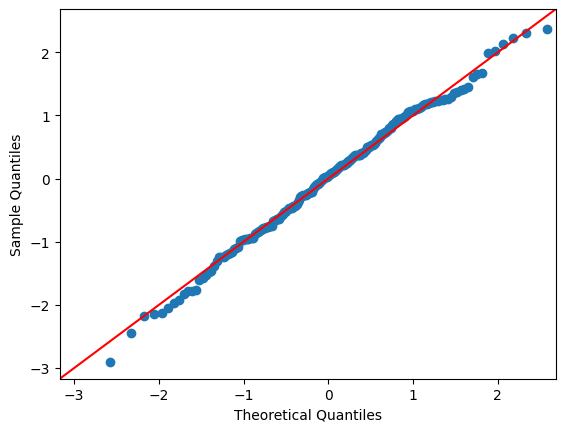

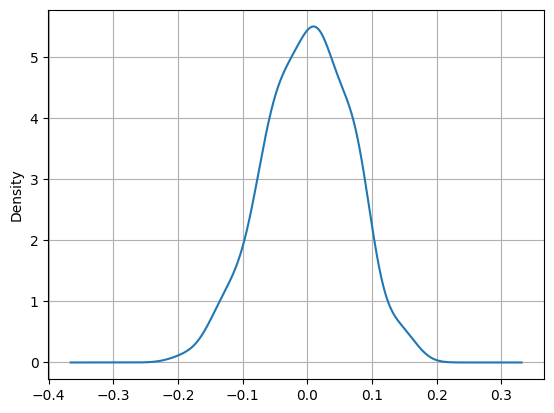

In [19]:
from scipy import stats
from statsmodels.graphics.api import qqplot
resid=loaded_model.resid
stats.normaltest(resid)
sm.ProbPlot(resid, stats.t,fit=True).ppplot(line='45')
sm.ProbPlot(resid, stats.t,fit=True).qqplot(line='45')

plt.figure()
x=pd.Series(resid)
p1=x.plot(kind='kde')   
plt.grid(True)
plt.show()

# save the summary of ARIMA to folder

In [5]:
import os 
import pandas as pd 
import glob
import json
path='../ARIMA_models/'
files_path=glob.glob(os.path.join(path,"*.pkl"))
arima_model_summary = dict()
for key,f in enumerate(files_path):
    loaded_model  = pickle.load(open( f, 'rb'))
    summart_path = '../ARIMA_summary/'+str(key)+'model.txt'
    pd.read_html(loaded_model.summary().tables[0].as_html(), header=0, index_col=0)[0].to_csv(summart_path,  sep=' ', mode='w')
    pd.read_html(loaded_model.summary().tables[1].as_html(), header=0, index_col=0)[0].to_csv(summart_path,  sep=' ', mode='a')
    pd.read_html(loaded_model.summary().tables[2].as_html(), header=0, index_col=0)[0].to_csv(summart_path,  sep=' ', mode='a')

# save summary of LSTM to folder

In [21]:
path='../LSTM_models/'
files_path=glob.glob(os.path.join(path,"*_128_LSTM.h5"))
lstm_model_summary = dict()
for key,f in enumerate(files_path):
    model = load_model(f)
    summart_path = '../LSTM_summary/'+str(key)+'model.txt'
    with open(summart_path, 'w') as f:
        model.summary(print_fn=lambda x: f.write(x + '\n'))

2022-10-31 02:07:24.041667: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:2d:00.0/numa_node
Your kernel may have been built without NUMA support.
2022-10-31 02:07:24.058628: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory
2022-10-31 02:07:24.058652: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2022-10-31 02:07:24.059079: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (o